# HR Analytics Project

HR Analytics Project- Understanding the Attrition in HR
Problem Statement:
Every year a lot of companies hire a number of employees. The companies invest time and money in training those employees, not just this but there are training programs within the companies for their existing employees as well. The aim of these programs is to increase the effectiveness of their employees. But where HR Analytics fit in this? and is it just about improving the performance of employees?

HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to applying analytic processes to the human resource department of an organization in the hope of improving employee performance and therefore getting a better return on investment. HR analytics does not just deal with gathering data on employee efficiency. Instead, it aims to provide insight into each process by gathering data and then using it to make relevant decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general, relatively high attrition is problematic for companies. HR professionals often assume a leadership role in designing company compensation programs, work culture, and motivation systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition? We will discuss the first question here and for the second question, we will write the code and try to understand the process step by step.

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring processes, paperwork, and new hire training are some of the common expenses of losing employees and replacing them. Additionally, regular employee turnover prohibits your organization from increasing its collective knowledge base and experience over time. This is especially concerning if your business is customer-facing, as customers often prefer to interact with familiar people. Errors and issues are more likely if you constantly have new workers.

 

Note: You can find the dataset in the link below.

Downlaod Files:
https://github.com/dsrscientist/IBM_HR_Attrition_Rate_Analytics

### Importing Library

In [255]:
#data lib
import pandas as pd
import numpy as np
%matplotlib inline

#visualization
import seaborn as sns
import matplotlib.pyplot as plt

#preprocessing

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV

#models

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier

#metrics

from sklearn.metrics import accuracy_score,classification_report,confusion_matrix,f1_score
#model save
import pickle
import warnings
warnings.filterwarnings('ignore')

### Data Loading

In [105]:
data=pd.read_csv('WA_Fn-UseC_-HR-Employee-Attrition.csv')
data.sample(10)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
1294,41,No,Travel_Rarely,447,Research & Development,5,3,Life Sciences,1,1814,...,1,80,0,11,3,1,3,2,1,2
868,28,No,Travel_Rarely,1179,Research & Development,19,4,Medical,1,1216,...,3,80,3,6,2,3,6,5,3,3
1217,24,No,Travel_Rarely,581,Research & Development,9,3,Medical,1,1707,...,4,80,1,5,1,3,5,3,0,4
355,26,No,Travel_Rarely,933,Sales,1,3,Life Sciences,1,476,...,2,80,1,8,3,3,8,7,7,7
488,42,No,Travel_Rarely,622,Research & Development,2,4,Life Sciences,1,659,...,2,80,2,10,4,3,10,2,2,2
615,27,No,Non-Travel,443,Research & Development,3,3,Medical,1,850,...,3,80,3,0,6,2,0,0,0,0
276,35,No,Travel_Rarely,1315,Research & Development,22,3,Life Sciences,1,381,...,2,80,1,10,6,2,7,7,6,2
1112,38,Yes,Travel_Rarely,903,Research & Development,2,3,Medical,1,1573,...,1,80,2,7,2,3,5,2,1,4
1210,33,No,Travel_Rarely,267,Research & Development,21,3,Medical,1,1698,...,4,80,3,14,6,3,14,11,2,13
1104,29,No,Travel_Rarely,598,Research & Development,9,3,Life Sciences,1,1558,...,1,80,2,5,2,2,1,0,0,0


### Data Overview

In [66]:
data.shape

(1470, 35)

Dataset have 1470 observations & 35 features

In [9]:
pd.DataFrame(data.columns)

,0
0,Age
1,Attrition
2,BusinessTravel
3,DailyRate
4,Department
5,DistanceFromHome
6,Education
7,EducationField
8,EmployeeCount
9,EmployeeNumber


In [10]:
data.nunique()

Age                           43
Attrition                      2
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EmployeeCount                  1
EmployeeNumber              1470
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBa

Features EmployeeCount,Over18,StandardHours have same value, so we can remove these features.

In [106]:
data.drop(columns=['EmployeeCount','Over18','StandardHours'],inplace=True)

Employee Number is unique data for each employee so no use of it.

In [107]:
data.drop(columns=['EmployeeNumber'],inplace=True)

In [108]:
data.shape

(1470, 31)

### Data Duplicacy Test

In [70]:
data.duplicated().sum()

0

No duplicacy in dataset

### Categorical & Null Testing

In [71]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 31 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EnvironmentSatisfaction   1470 non-null   int64 
 9   Gender                    1470 non-null   object
 10  HourlyRate                1470 non-null   int64 
 11  JobInvolvement            1470 non-null   int64 
 12  JobLevel                  1470 non-null   int64 
 13  JobRole                   1470 non-null   object
 14  JobSatisfaction         

In [123]:
data.isna().sum()

Age                                  0
Attrition                            0
DailyRate                            0
DistanceFromHome                     0
Education                            0
EnvironmentSatisfaction              0
Gender                               0
HourlyRate                           0
JobInvolvement                       0
JobLevel                             0
JobSatisfaction                      0
MonthlyIncome                        0
MonthlyRate                          0
NumCompaniesWorked                   0
OverTime                             0
PercentSalaryHike                    0
PerformanceRating                    0
RelationshipSatisfaction             0
StockOptionLevel                     0
TotalWorkingYears                    0
TrainingTimesLastYear                0
WorkLifeBalance                      0
YearsAtCompany                       0
YearsInCurrentRole                   0
YearsSinceLastPromotion              0
YearsWithCurrManager     

Dataset have no null values but there are mentioned below non numeric features:

1   Attrition                 1470 non-null   object

2   BusinessTravel            1470 non-null   object

4   Department                1470 non-null   object

7   EducationField            1470 non-null   object

9   Gender                    1470 non-null   object

13  JobRole                   1470 non-null   object 

15  MaritalStatus             1470 non-null   object

19  OverTime                  1470 non-null   object

### Features Encoding

In [109]:
#Target Encoding

data['Attrition']=data['Attrition'].map({'Yes':1,'No':0})

#gender & Overtime are binary features so we can simply convert it in 0 and 1. 


data['Gender']=data['Gender'].map({'Male':1,'Female':0})
data['OverTime']=data['OverTime'].map({'Yes':1,'No':0})

#wil apply one hot encoder on rest of the cat features.

In [110]:
enc_df=data[['BusinessTravel','Department','EducationField','JobRole','MaritalStatus']].copy()

In [117]:
data.drop(columns=['BusinessTravel','Department','EducationField','JobRole','MaritalStatus'],inplace=True)

In [114]:
enc_df=pd.get_dummies(enc_df,prefix=['BusinessTravel','Department','EducationField','JobRole','MaritalStatus'],drop_first=True)
#pd.get_dummies(diff, prefix=['column1', 'column2']))

In [120]:
data=pd.concat([data,enc_df],axis=1)

In [121]:
data.shape

(1470, 45)

In [122]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 45 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   Age                                1470 non-null   int64
 1   Attrition                          1470 non-null   int64
 2   DailyRate                          1470 non-null   int64
 3   DistanceFromHome                   1470 non-null   int64
 4   Education                          1470 non-null   int64
 5   EnvironmentSatisfaction            1470 non-null   int64
 6   Gender                             1470 non-null   int64
 7   HourlyRate                         1470 non-null   int64
 8   JobInvolvement                     1470 non-null   int64
 9   JobLevel                           1470 non-null   int64
 10  JobSatisfaction                    1470 non-null   int64
 11  MonthlyIncome                      1470 non-null   int64
 12  MonthlyRate         

All features are numeric now & no null value.

### Describe Dataset

In [128]:
pd.set_option('max_columns', 45)

In [129]:
data.describe()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,0.161224,802.485714,9.192517,2.912925,2.721769,0.600000,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,0.282993,15.209524,3.153741,2.712245,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129,0.188435,0.709524,0.653741,0.303401,0.412245,0.108163,0.315646,0.055782,0.089796,0.035374,0.176190,0.069388,0.098639,0.054422,0.198639,0.221769,0.056463,0.457823,0.319728
std,9.135373,0.367863,403.509100,8.106864,1.024165,1.093082,0.490065,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,0.450606,3.659938,0.360824,1.081209,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136,0.391193,0.454137,0.475939,0.459884,0.492406,0.310692,0.464931,0.229579,0.285986,0.184786,0.381112,0.254199,0.298279,0.226925,0.399112,0.415578,0.230891,0.498387,0.466530
min,18.000000,0.000000,102.000000,1.000000,1.000000,1.000000,0.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,0.000000,11.000000,3.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,0.000000,465.000000,2.000000,2.000000,2.000000,0.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,0.000000,12.000000,3.000000,2.000000,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,36.000000,0.000000,802.000000,7.000000,3.000000,3.000000,1.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,0.000000,14.000000,3.000000,3.000000,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,43.000000,0.000000,1157.000000,14.000000,4.000000,4.000000,1.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,1.000000,18.000000,3.000000,4.000000,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,60.000000,1.000000,1499.00000

Here again we can see all features are having same data.
all features looking normal.

### Correlation

In [130]:
data.corr()

,Age,Attrition,DailyRate,DistanceFromHome,Education,EnvironmentSatisfaction,Gender,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,OverTime,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,BusinessTravel_Travel_Frequently,BusinessTravel_Travel_Rarely,Department_Research & Development,Department_Sales,EducationField_Life Sciences,EducationField_Marketing,EducationField_Medical,EducationField_Other,EducationField_Technical Degree,JobRole_Human Resources,JobRole_Laboratory Technician,JobRole_Manager,JobRole_Manufacturing Director,JobRole_Research Director,JobRole_Research Scientist,JobRole_Sales Executive,JobRole_Sales Representative,MaritalStatus_Married,MaritalStatus_Single
Age,1.000000,-0.159205,0.010661,-0.001686,0.208034,0.010146,-0.036311,0.024287,0.029820,0.509604,-0.004892,0.497855,0.028051,0.299635,0.028062,0.003634,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089,-0.024743,0.028791,0.017883,-0.027549,0.016824,0.038162,-0.006354,-0.041466,-0.027604,-0.029856,-0.143176,0.294248,0.049726,0.185891,-0.146518,-0.002001,-0.175785,0.083919,-0.119185
Attrition,-0.159205,1.000000,-0.056652,0.077924,-0.031373,-0.103369,0.029453,-0.006846,-0.130016,-0.169105,-0.103481,-0.159840,0.015170,0.043494,0.246118,-0.013478,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199,0.115143,-0.049538,-0.085293,0.080855,-0.032703,0.055781,-0.046999,-0.017898,0.069355,0.036215,0.098290,-0.083316,-0.082994,-0.088870,-0.000360,0.019774,0.157234,-0.090984,0.175419
DailyRate,0.010661,-0.056652,1.000000,-0.004985,-0.016806,0.018355,-0.011716,0.023381,0.046135,0.002966,0.030571,0.007707,-0.032182,0.038153,0.009135,0.022704,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363,-0.011776,0.002078,0.014871,-0.003616,0.004028,-0.064449,0.034202,-0.003893,0.030869,-0.021156,-0.006728,-0.013224,-0.005302,-0.000021,-0.002624,-0.000513,0.005375,0.040035,-0.075835
DistanceFromHome,-0.001686,0.077924,-0.004985,1.000000,0.021042,-0.016075,-0.001851,0.031131,0.008783,0.005303,-0.003669,-0.017014,0.027473,-0.029251,0.025514,0.040235,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406,0.005081,-0.020116,-0.008117,0.014085,-0.024499,0.039294,0.013486,-0.007969,-0.014802,-0.024089,0.012369,-0.039190,0.011848,-0.022351,-0.010986,0.030761,-0.015994,0.030232,-0.027445
Education,0.208034,-0.031373,-0.016806,0.021042,1.000000,-0.027128,-0.016547,0.016775,0.042438,0.101589,-0.011296,0.094961,-0.026084,0.126317,-0.020322,-0.011111,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065,-0.008292,0.004126,-0.018604,0.014215,0.013184,0.072405,-0.072335,0.038043,-0.026742,-0.005295,-0.063566,0.028453,-0.005290,0.049694,0.000709,0.053398,-0.091465,-0.001865,0.004168
EnvironmentSatisfaction,0.010146,-0.103369,0.018355,-0.016075,-0.027128,1.000000,0.000508,-0.049857,-0.008278,0.001212,-0.006784,-0.006259,0.037600,0.012594,0.070132,-0.031701,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999,-0.012624,0.008496,0.027976,-0.025606,-0.024526,0.000479,-0.021299,0.064602,0.027713,-0.022014,-0.001533,0.010730,0.059178,-0.048689,0.001940,-0.024421,0.002949,-0.022180,0.009035
Gender,-0.036311,0.029453,-0.011716,-0.001851,-0.016547,0.000508,1.000000,-0.000478,0.017960,-0.039403,0.033252,-0.031858,-0.041482,-0.039147,-0.041924,0.002733,-0.013859,0.022868,0.012716,-0.046881,-0.038787,-0.002753,-0.029747,-0.041483,-0.026985,-0.030599,-0.022015,-0.014682,0.015760,-0.032017,0.006770,-0.024143,-0.013146,0.022992,0.003886,0.036082,0.067793,-0.033880,-0.065197,-0.006121,0.009745,-0.005348,-0.028877,-0.007804,-0.032752
HourlyRate,0.024287,-0.006846,0

In [140]:
plt.figure(figsize=(300,290))
sns.heatmap(data.corr(),annot=True,annot_kws={'size': 100})
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

since chart is not clear due to many feature so will try to check correlation with target.

No multicollinearity problem in dataset.

In [154]:
pd.DataFrame(data.corrwith(data["Attrition"]),columns=['feature']).sort_values(by='feature')

,feature
TotalWorkingYears,-0.171063
JobLevel,-0.169105
YearsInCurrentRole,-0.160545
MonthlyIncome,-0.159840
Age,-0.159205
YearsWithCurrManager,-0.156199
StockOptionLevel,-0.137145
YearsAtCompany,-0.134392
JobInvolvement,-0.130016
JobSatisfaction,-0.103481


Overtime has maximum correlation with Target-Attrition 24%.

HourlyRate,JobRole_Research Scientist,PerformanceRating have very less or no relation with target to removing these 3 features.

In [156]:
data.drop(columns=['HourlyRate','JobRole_Research Scientist','PerformanceRating'],inplace=True)

As we have many features so perform select K best features.

### Feature Selection

In [160]:
from sklearn.feature_selection import SelectKBest,f_classif

In [158]:
X=data.drop('Attrition',axis=1)
y=data.Attrition

In [178]:
# find out score of each feature using k best
best_feature=SelectKBest(score_func=f_classif,k=25)
fit=best_feature.fit(X,y)

scores=pd.DataFrame(fit.scores_)
scores['feature_name']=X.columns
scores.columns=['score','column_name']
scores.sort_values(by=['score'],ascending=False).reset_index()

,index,score,column_name
0,12,94.656457,OverTime
1,40,46.606985,MaritalStatus_Single
2,16,44.252491,TotalWorkingYears
3,7,43.215344,JobLevel
4,20,38.838303,YearsInCurrentRole
5,9,38.488819,MonthlyIncome
6,0,38.175887,Age
7,38,37.212798,JobRole_Sales Representative
8,22,36.712311,YearsWithCurrManager
9,15,28.140501,StockOptionLevel


In [179]:
#select top 25 features which performing highest.
scores.nlargest(25,'score').column_name

12                             OverTime
40                 MaritalStatus_Single
16                    TotalWorkingYears
7                              JobLevel
20                   YearsInCurrentRole
9                         MonthlyIncome
0                                   Age
38         JobRole_Sales Representative
22                 YearsWithCurrManager
15                     StockOptionLevel
19                       YearsAtCompany
6                        JobInvolvement
23     BusinessTravel_Travel_Frequently
8                       JobSatisfaction
4               EnvironmentSatisfaction
33        JobRole_Laboratory Technician
39                MaritalStatus_Married
36            JobRole_Research Director
25    Department_Research & Development
34                      JobRole_Manager
35       JobRole_Manufacturing Director
26                     Department_Sales
2                      DistanceFromHome
31      EducationField_Technical Degree
18                      WorkLifeBalance


In [180]:
New_X=data[scores.nlargest(25,'score').column_name]

In [181]:
data=pd.concat([New_X,y],axis=1)

In [183]:
data.shape

(1470, 26)

### Distribution Plot

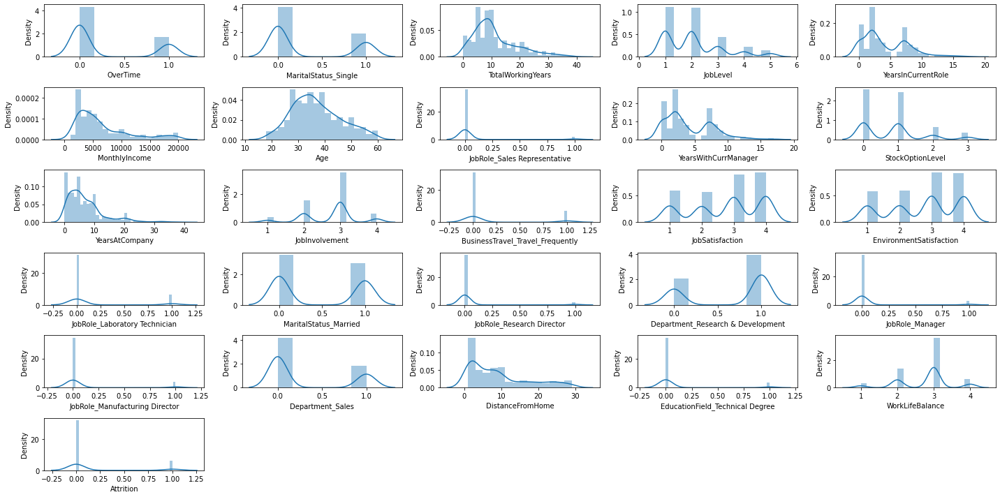

In [191]:
plt.figure(figsize=(20,10))

plotnumber=1

for col in data:
    if plotnumber<=30:
        ax=plt.subplot(6,5,plotnumber)
        sns.distplot(data[col])
        
    plotnumber+=1
    
plt.tight_layout()

most of the features are not continious data here thats why features are not normally distributed.

### Box plot to check outliers

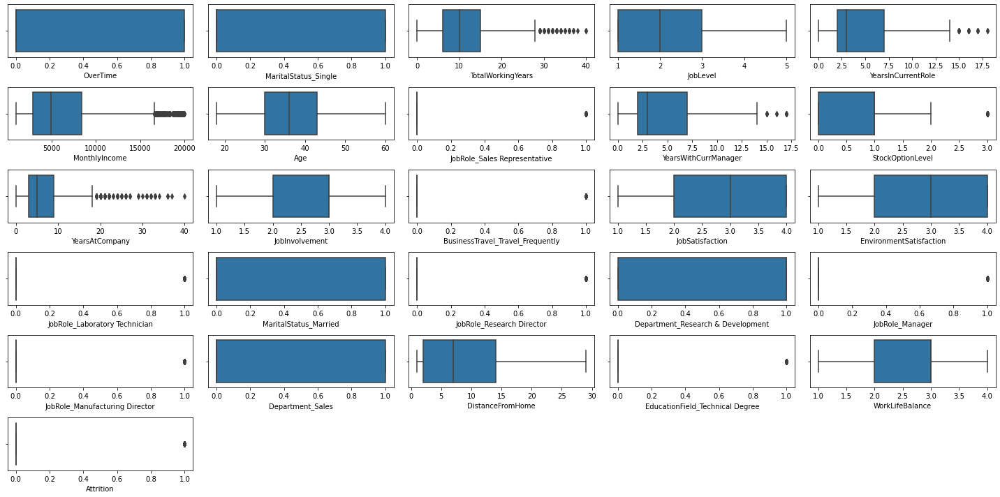

In [186]:
plt.figure(figsize=(20,10))

plotnumber=1

for col in data:
    if plotnumber<=30:
        ax=plt.subplot(6,5,plotnumber)
        sns.boxplot(data[col])
        
    plotnumber+=1
    
plt.tight_layout()

Few features are having vey less number of  outliers but at its real data so not removing

### Data Imbalance Test

0    1233
1     237
Name: Attrition, dtype: int64


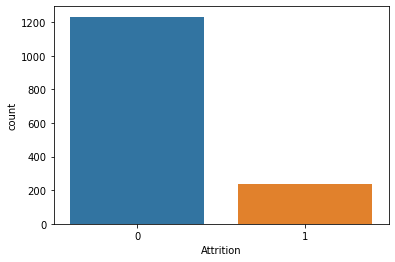

In [220]:
sns.countplot(data.Attrition)
print(data.Attrition.value_counts())

In [224]:
data['Attrition'].value_counts()

print('1 category %:',round(237/(1470)*100))
print('0 category %:',round(1233/(1470)*100))

1 category %: 16
0 category %: 84


Its imbalance dataset having only 237 labels with value 1 against 1233 in value 0. we need to resample data to overcome imbalancing.

### Resampling

In [229]:
from sklearn.utils import resample

In [227]:
#Split data with least target variable i.e. 1 for upsampling 
resam_data1=data[data.Attrition==1]
resam_data0=data[data.Attrition==0]
print(resam_data1['Attrition'].count())
print(resam_data0['Attrition'].count())

237
1233


In [230]:
#Since we have 1233 observation with 0, so will upsample 1 to same. 
upsample=resample(resam_data1,replace=True,n_samples=1233,random_state=22)

In [231]:
upsample.shape

(1233, 26)

In [232]:
#combining again both dataset
data_new=pd.concat([resam_data0,upsample],axis=0)

In [233]:
data_new.shape

(2466, 26)

### Split data

In [234]:
#dataset split

X=data_new.drop(columns=['Attrition'])
y=data_new.Attrition

### Scaling

In [235]:
scale=StandardScaler()
x_scale=scale.fit_transform(X)

In [236]:
# testing best random state
for i in range(10,100,3):
    x_train,x_test,y_train,y_test=train_test_split(x_scale,y,test_size=0.25,random_state=i)
    lr=LogisticRegression()
    lr.fit(x_train,y_train)

    y_pred=lr.predict(x_test)

    print(accuracy_score(y_test,y_pred)*100,i)

79.2544570502431 10
76.82333873581848 13
76.01296596434359 16
76.01296596434359 19
76.33711507293354 22
75.20259319286872 25
76.82333873581848 28
76.6612641815235 31
76.49918962722853 34
74.39222042139384 37
80.55105348460292 40
74.7163695299838 43
75.3646677471637 46
74.23014586709886 49
78.7682333873582 52
77.3095623987034 55
75.85089141004863 58
74.23014586709886 61
75.3646677471637 64
74.06807131280388 67
76.82333873581848 70
73.58184764991897 73
76.17504051863857 76
76.98541329011344 79
73.90599675850892 82
74.7163695299838 85
77.14748784440843 88
76.17504051863857 91
78.6061588330632 94
73.41977309562398 97


### Train Test Split

In [237]:
x_train,x_test,y_train,y_test=train_test_split(x_scale,y,test_size=0.20,random_state=40)

### Models instantiate

In [243]:
lr=LogisticRegression()
rfc=RandomForestClassifier()
knn=KNeighborsClassifier()
dt=DecisionTreeClassifier()

### Fitting Models

In [244]:
lr.fit(x_train,y_train)
rfc.fit(x_train,y_train)
knn.fit(x_train,y_train)
dt.fit(x_train,y_train)

DecisionTreeClassifier()

### Training score

In [282]:
print(lr.score(x_train,y_train)*100)
print(rfc.score(x_train,y_train)*100)
print(knn.score(x_train,y_train)*100)
print(dt.score(x_train,y_train)*100)

75.10141987829616
99.0365111561866
90.31440162271805
100.0


### Score on test data

In [246]:
#lr score

y_pred=lr.predict(x_test)
print(accuracy_score(y_test,y_pred)*100)

80.97165991902834


In [247]:
#rfc score

y_pred=rfc.predict(x_test)
print(accuracy_score(y_test,y_pred)*100)

97.97570850202429


In [283]:
#knn score

y_pred=knn.predict(x_test)
print(accuracy_score(y_test,y_pred)*100)

86.43724696356276


In [249]:
y_pred=dt.predict(x_test)
print(accuracy_score(y_test,y_pred)*100)

92.3076923076923


### Cross Validation

In [250]:
from sklearn.model_selection import cross_val_score

In [252]:
print('Logistic Regression score:',np.mean(cross_val_score(lr,x_scale,y))*100)

print('Random Forest score:',np.mean(cross_val_score(rfc,x_scale,y))*100)

print('KNN score:',np.mean(cross_val_score(knn,x_scale,y))*100)

print('Decision Tree score:',np.mean(cross_val_score(dt,x_scale,y))*100)

Logistic Regression score: 75.46673674355964
Random Forest score: 96.9178211561045
KNN score: 83.98288590879602
Decision Tree score: 93.30949076545319


In [253]:
y_pred=rfc.predict(x_test)
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       242
           1       0.96      1.00      0.98       252

    accuracy                           0.98       494
   macro avg       0.98      0.98      0.98       494
weighted avg       0.98      0.98      0.98       494



#### RandomFores performing best on this problem  with-Training score-100%, Test score-98%,CV score-97-its generalized model.

### Hyperparameter Tunning

However we are getting very good score app. 98% but still we will try to improve it using parameter tunning.

In [256]:
params={'n_estimators':[5,10,25,40,70,100],
        'criterion':['gini','entropy'],
        'min_samples_split':[1,2,6,12],
        'min_samples_leaf':[2,5,10],
        'max_depth':[5,10,20]        
        
    
}

grd=GridSearchCV(rfc,param_grid=params)
grd.fit(x_train,y_train)
grd.best_params_

{'criterion': 'entropy',
 'max_depth': 20,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 70}

In [272]:
rfc=RandomForestClassifier(criterion= 'entropy',
 max_depth= 22,
 min_samples_leaf= 3,
 min_samples_split= 2,
 n_estimators= 70)

In [273]:
rfc.fit(x_train,y_train)
y_pred=rfr.predict(x_test)
print(accuracy_score(y_test,y_pred)*100)

97.77327935222672


Since score is already good around 98% which is best but still we tried to tune different params to increase it. getting almost same score as we got with default parameters.

### Final Scoring

In [274]:
confusion_matrix(y_test,y_pred)

array([[231,  11],
       [  0, 252]], dtype=int64)

In [275]:
print(f1_score(y_test,y_pred))

0.9786407766990292


In [276]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.98       242
           1       0.96      1.00      0.98       252

    accuracy                           0.98       494
   macro avg       0.98      0.98      0.98       494
weighted avg       0.98      0.98      0.98       494



### Model performing very well with around 98% accuracy

### ROC Curve Plot

In [278]:
from sklearn.metrics import plot_roc_curve

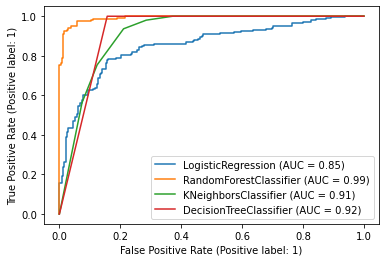

In [280]:
disp=plot_roc_curve(lr,x_test,y_test)
plot_roc_curve(rfc,x_test,y_test,ax=disp.ax_)
plot_roc_curve(knn,x_test,y_test,ax=disp.ax_)
plot_roc_curve(dt,x_test,y_test,ax=disp.ax_)

### AUC_ROC score for random forest classifier is 99%

### Model Save

In [281]:
filename='Attrition.pickle'
pickle.dump(rfc,open(filename,'wb'))

we hereby build a model over attrition problem and found random forest algorithm working best with given data.

Its predicting over test data with around 98 % accuracy.

we observed here that these top features have most impact on attrition.

OverTime

MaritalStatus_Single
 
TotalWorkingYears

JobLevel

YearsInCurrentRole


so company should focus over these things to control employees attrition.
